
<div style="text-align: right"><b>20th, May 2022<br>Author: Sebastian Heß</b></div>

# Data Science: Airbnb Munich - Machine Learning Analysis.

#### This project was part of my Udacity Data Scientist Nanodegree and helped me to deepen my skills, knowledge and experience about data science, machine learning and writing a Data Science blog post (<a href="https://github.com/SebastianHess/airbnb_munich">My Github Repository</a>).<br>



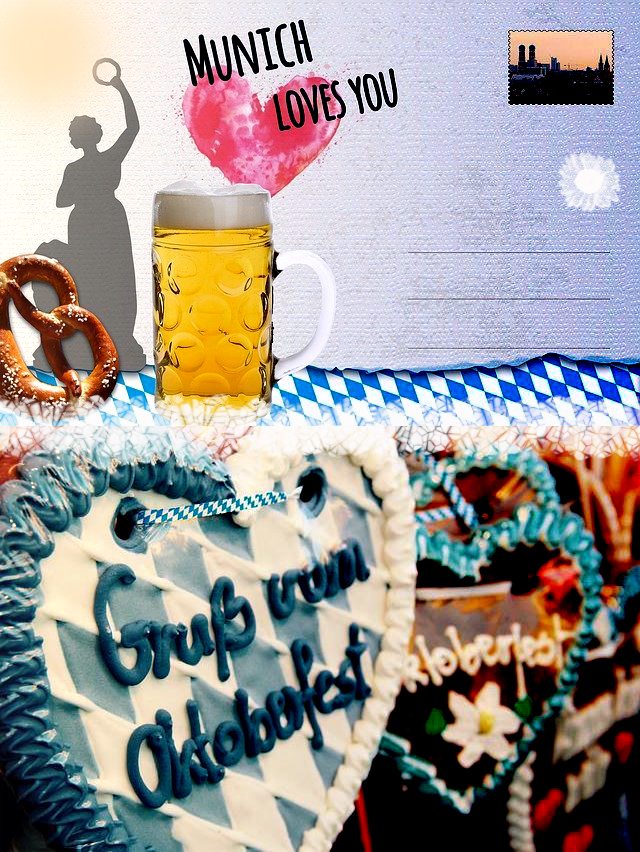

---

<a id='top'></a>
## Table of Contents
_CRISP-DM (Cross Industry Process for Data Mining)_<br><br>

<ol class="level_1">
    <li><a href="#bun">Business Understanding</a></li>
    <ol class="level_2">
        <li><a href="#int">Introduction</a></li>
    </ol>
    <li><a href="#dun">Data Understanding</a></li>
    <ol class="level_2">
        <li><a href="#gat">Gathering</a></li>
        <li><a href="#ass">Assessing</a></li>
    </ol>
    <li><a href="#pre">Preparing Data</a></li>
    <ol class="level_2">
        <li><a href="#cle">Cleaning</a></li>
    </ol>
    <li><a href="#mod">Model Data</a></li>
    <ol class="level_2">
        <li><a href="#atq">Answering the Questions</a></li>
    </ol>
    <li><a href="#etr">Evaluate the Results</a></li>
    <ol class="level_2">
        <li><a href="#con">Conclusions</a></li>
    </ol>
    <li><a href="#dep">Deploy</a></li>
</ol>

---

<a id='bun'></a>
## 1. Business Understanding
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

<a id='int'></a>
### 1.A. Introduction
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

I live in Munich and when I travel to other places and countries, I mostly use the Airbnb platform. I guess each one of you knows what I am talking about. Therefore, I would like to answer these questions for my hometown Munich based on a data set provided by _Insideairbnb.com_.
<br>

1. <a href="#qu1">Will I quickly find a suitable apartment in Munich?</a>
2. <a href="#qu2">Which district is the most chosen one based on the best ratings?</a>
3. <a href="#qu3">Which apartments are not attractive at all in Munich?</a>
4. <a href="#qu4">What features are contributing to estimate the price of an apartment?</a>
<br><br>

<b>Data Source:</b>
 - <a href="http://insideairbnb.com/get-the-data/">Data Source</a>  (_Date Compiled: 24 December, 2021_)

<a id='libmo'></a>

### 1.A.1. Imported Libraries and Modules
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

> * **OS** a python module which priveds functions for interacting with the operating system OS.
> * **Numpy** a Python library for working with arrays.
> * **Pandas** a Python library for data manipulating and analysis.
> * **pd.pandas.set_option( )** a Pandas option to visualise all of the columns in a data frame.
> * **folium** a Pandas library to visualise interactive maps.
> * **Matplotlib** a Python library for data visualizations.
> * **%matplotlib inline** a magic function for inline plotting of graphs.
> * **sklearn.linear_model** a class of the sklearn module containing different functions for performing machine learning with linear models.
> * **sklearn.model_selection** a class of the sklearn module splitting the data in train and test data.
> * **sklearn.metrics** a class of the sklearn metrics to use with any continous response variable.
> * **Seaborn** a Python library for data visuallization based on matplotlib.
> * **sns.set_style** to define the seaborn figure aesthetic as "darkgrid".
> * **dataframe_image** to save pictures of data frames.

In [827]:
import os as os
import numpy as np
import pandas as pd
pd.pandas.set_option('display.max_columns', None)
import folium
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
sns.set_style('darkgrid')
import dataframe_image as dfi

---

<a id='helpfu'></a>
### 1.A.2. Helper Functions
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>


**Defining** helper functions for the Analysis.<br><br>

In [828]:
# HELPER FUNCTION
# Python Function that defines the size, the dots per inches, the facecolor of the axes, the figure patch edgecolor 
# and the color of the color of the background of the plots and returns it.

def fig_axes():
    '''
    Defines the size, the dots per inches, the facecolor of the axes, the figure patch edgecolor 
    and the color of the color of the background of the plots and returns it.
    '''
    plt.subplots(figsize=(15, 5), dpi=80, facecolor='w', edgecolor='k')
    sns.set_style('darkgrid')
    print()

In [829]:
# HELPER FUNCTION
# Python Function that defines the size, the dots per inches, the facecolor of the axes, the figure patch edgecolor 
# and the color of the color of the background of the heatmap plots and returns it.
def fig_axes_geo():
    '''
    Defines the size, the dots per inches, the facecolor of the axes, the figure patch edgecolor 
    and the color of the color of the background of the heatmap plots and returns it.
    '''
    plt.subplots(figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')
    sns.set_style('darkgrid')
    print()

In [830]:
# HELPER FUNCTION
# Python Function that defines the size, the dots per inches, the facecolor of the axes, the figure patch edgecolor 
# and the color of the color of the background of the heatmap plots and returns it.
def fig_axes_hm():
    '''
    Defines the size, the dots per inches, the facecolor of the axes, the figure patch edgecolor 
    and the color of the color of the background of the heatmap plots and returns it.
    '''
    plt.subplots(figsize=(9, 9), dpi=80, facecolor='w', edgecolor='k')
    sns.set_style('darkgrid')
    print()

In [831]:
# HELPER FUNCTION
# Defining function for creating clickable URL links.
# (Source of code parts: https://datascientyst.com/create-clickable-link-pandas-dataframe-jupyterlab/)
def link(val):
    return f'<a target="_blank" href="{val}">{val}</a>'

# Creating clickable URL link: 'df_.style.format({'---URL_link---': link})'

---

<a id='dun'></a>
## 2. Data Understanding
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

<a id='gat'></a>
### 2.A. Gathering
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

**Reading** the data set `listings.csv` into the Pandas data frame `df`.<br><br>

In [832]:
# Loading in the dataset into a pandas data frame.
df = pd.read_csv('listings.csv')

<a id='ass'></a>
### 2.B. Assessing
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

**Assessing** the data set to get a first overview of the dimensions and a better understanding of the data and its statistics.<br><br>

In [833]:
# Checking the first 5 rows of the data frame.
df.head(5)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,97945,https://www.airbnb.com/rooms/97945,20211224070709,2021-12-24,Deluxw-Apartm. with roof terrace,"<b>The space</b><br />We offer a modern, quiet...",We are living in a outskirt of Munich its call...,https://a0.muscache.com/pictures/2459996/10b4c...,517685,https://www.airbnb.com/users/show/517685,Angelika,2011-04-18,"Munich, Bayern, Germany",Ich freue mich auf viele internationale Gäste!...,within a few hours,100%,NaN,t,https://a0.muscache.com/im/users/517685/profil...,https://a0.muscache.com/im/users/517685/profil...,Hadern,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Munich, Bavaria, Germany",Hadern,NaN,48.11492,11.48954,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Room-darkening shades"", ""Long term stays all...",$80.00,2,90,2.0,2.0,90.0,90.0,2.0,90.0,NaN,t,0,1,2,22,2021-12-24,129,0,0,2011-10-03,2019-10-03,4.84,4.89,4.82,4.90,4.93,4.78,4.73,NaN,f,2,2,0,0,1.04
1,114695,https://www.airbnb.com/rooms/114695,20211224070709,2021-12-24,Apartment Munich/East with sundeck,<b>The space</b><br />It´s a quiet and sunny a...,NaN,https://a0.muscache.com/pictures/21571874/960e...,581737,https://www.airbnb.com/users/show/581737,Stephan,2011-05-12,"Munich, Bayern, Germany",I am looking forward to meet interesting peopl...,within a few hours,100%,100%,f,https://a0.muscache.com/im/users/581737/profil...,https://a0.muscache.com/im/users/581737/profil...,Berg am Laim,3.0,3.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,NaN,Berg am Laim,NaN,48.12071,11.63758,Entire rental unit,Entire home/apt,5,NaN,1 bath,1.0,3.0,"[""Long term stays allowed"", ""Hangers"", ""Smoke ...",$95.00,2,30,2.0,2.0,1125.0,1125.0,2.0,1125.0,NaN,t,0,0,0,52,2021-12-24,53,0,0,2011-07-08,2019-10-06,4.77,4.71,4.96,4.96,5.00,4.55,4.60,NaN,f,2,2,0,0,0.42
2,127383,https://www.airbnb.com/rooms/127383,20211224070709,2021-12-24,City apartment next to Pinakothek,<b>The space</b><br />My cosy apartment is loc...,NaN,https://a0.muscache.com/pictures/79238c11-bc61...,630556,https://www.airbnb.com/users/show/630556,Sonja,2011-05-26,"Munich, Bayern, Germany","Hi, mein Name ist Sonja und ich freue mich net...",within a few hours,100%,83%,f,https://a0.muscache.com/im/users/630556/profil...,https://a0.muscache.com/im/users/630556/profil...,Maxvorstadt,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'selfie...",t,t,NaN,Maxvorstadt,NaN,48.15199,11.56482,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.0,1.0,"[""Breakfast"", ""Hangers"", ""Smoke alarm"", ""Coffe...",$99.00,3,14,3.0,3.0,14.0,14.0,3.0,14.0,NaN,t,4,4,4,4,2021-12-24,101,8,0,2011-06-04,2021-10-11,4.86,4.92,4.80,4.98,4.96,4.91,4.82,NaN,f,1,1,0,0,0.79
3,159634,https://www.airbnb.com/rooms/159

In [834]:
# Checking the size of the data frame (rows, columns).
df.shape

(4995, 74)

In [835]:
# Checking general information of the data frame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4995 entries, 0 to 4994
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4995 non-null   int64  
 1   listing_url                                   4995 non-null   object 
 2   scrape_id                                     4995 non-null   int64  
 3   last_scraped                                  4995 non-null   object 
 4   name                                          4994 non-null   object 
 5   description                                   4818 non-null   object 
 6   neighborhood_overview                         2698 non-null   object 
 7   picture_url                                   4995 non-null   object 
 8   host_id                                       4995 non-null   int64  
 9   host_url                                      4995 non-null   o

> There are a lot columns which are not necessary for the analysis and can be dropped.<br><br>

In [836]:
# Checking the descriptive statistics.
df.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,4.995000e+03,4.995000e+03,4.995000e+03,4994.000000,4994.000000,0.0,4995.000000,4995.000000,4995.000000,0.0,4466.000000,4856.000000,4995.000000,4995.000000,4994.000000,4994.000000,4.994000e+03,4.994000e+03,4994.000000,4.994000e+03,0.0,4995.000000,4995.000000,4995.000000,4995.000000,4995.000000,4995.000000,4995.000000,3812.000000,3762.000000,3763.000000,3762.000000,3762.000000,3762.000000,3762.000000,0.0,4995.000000,4995.000000,4995.000000,4995.000000,3812.000000
mean,3.116651e+07,2.021122e+13,1.268842e+08,8.244093,8.244093,NaN,48.140613,11.565088,2.653453,NaN,1.255710,1.661244,9.006807,544.765966,8.617741,9.408690,3.870755e+06,3.870787e+06,9.091149,3.870774e+06,NaN,12.983383,27.988388,44.091491,135.479680,22.338138,3.485686,0.252853,4.683854,4.806845,4.724765,4.847469,4.855253,4.787403,4.634155,NaN,2.559159,1.464064,1.010210,0.030831,0.769231
std,1.583446e+07,6.289692e-01,1.269006e+08,141.981955,141.981955,NaN,0.025502,0.047024,1.597651,NaN,1.234624,1.714886,31.415472,572.894548,27.833563,31.648729,9.109164e+07,9.109164e+07,31.245077,9.109164e+07,NaN,12.626386,25.867927,39.014341,136.233306,55.676039,12.682482,1.086161,0.664519,0.380242,0.443512,0.356346,0.342654,0.329389,0.443095,NaN,4.541520,3.784448,2.913259,0.244790,1.514429
min,9.794500e+04,2.021122e+13,1.467800e+04,0.000000,0.000000,NaN,48.068870,11.366801,0.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.967113e+07,2.021122e+13,1.801868e+07,1.000000,1.000000,NaN,48.123745,11.540435,2.000000,NaN,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,3.000000e+01,3.100000e+01,1.000000,3.100000e+01,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.650000,4.760000,4.630000,4.830000,4.850000,4.700000,4.500000,NaN,1.000000,0.000000,0.000000,0.000000,0.130000
50%,3.389446e+07,2.021122e+13,7.517409e+07,1.000000,1.000000,NaN,48.137520,11.565530,2.000000,NaN,1.000000,1.000000,2.000000,365.000000,2.000000,2.000000,1.125000e+03,1.125000e+03,2.000000,1.125000e+03,NaN,10.000000,23.000000,49.000000,88.000000,4.000000,0.000000,0.000000,4.860000,4.930000,4.890000,4.980000,5.000000,4.880000,4.730000,NaN,1.000000,1.000000,0.000000,0.000000,0.340000
75%,4.412149e+07,2.021122e+13,2.214483e+08,2.000000,2.000000,NaN,48.157410,11.586970,3.000000,NaN,1.000000,2.000000,5.000000,1125.000000,5.000000,5.000000,1.125000e+03,1.125000e+03,5.000000,1.125000e+03,NaN,28.000000,57.000000,87.000000,268.000000,17.000000,2.000000,0.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.940000,NaN,2.000000,1.000000,1.000000,0.000000,0.880000
max,5.394958e+07,2.021122e+13,4.363263e+08,3750.000000,3750.000000,NaN,48.229500,11.711980,16.000000,NaN,50.000000,50.000000,1000.000000,18180.000000,800.000000,1000.000000,2.147484e+09,2.147484e+09,961.700000,2.147484e+09,NaN,30.000000,60.000000,90.000000,365.000000,765.000000,450.000000,37.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,NaN,33.000000,33.000000,28.00000

> The data includes Nan values.<br><br>

In [837]:
# Checking for duplicates.
df.duplicated().sum()

0

> There are NO duplicates within the data.<br><br>

In [838]:
# Checking for NaN values.
df.isnull().sum().any()

True

> The Check for NaN values is posititve. The data contents NaN values. <br><br>

In [839]:
# Checking for NaN values more detailed.
df.isna().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
name                                               1
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               1183
Length: 74, dtype: int64

In [840]:
# Checking for NaN values more detailed in an example column.
df.bathrooms.isnull().sum()

4995

> Checking for NaN values more detailed to understand the data. <br><br>

In [841]:
# Checking the columns which only consits of NaN values.
df_null = df.loc[:, df.isnull().all()]
df_null.head(5)

,neighbourhood_group_cleansed,bathrooms,calendar_updated,license
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN


> Extracting the columns which consits only of NaN values. <br><br>

In [842]:
# HELPER FUNCTION
# Python Function that takes the data frame and the column as a string.
# And returns a table of the column consisting of all rows with NaN value.

def get_null_rows(column_name, df):
    '''
    INPUT - column_name - string - the name of the column you would like to know about
            df_clean - data frame - pandas data frame of cleaning process step
    OUTPUT - n_rows - table - Allthe rows with NaN values of the column
    '''
    n_rows = df[df[column_name].isna()]
    
    return n_rows

> Function which helps to detect NaN values of a specific column. <br><br>

In [843]:
# Checking for NaN values in a specific column via function.
get_null_rows('name', df) 

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
1342,20602858,https://www.airbnb.com/rooms/20602858,20211224070709,2021-12-24,NaN,NaN,NaN,https://a0.muscache.com/pictures/76fa1e39-1fb8...,147235098,https://www.airbnb.com/users/show/147235098,Balazs,2017-08-22,DE,NaN,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/e053b...,https://a0.muscache.com/im/pictures/user/e053b...,Münchner Freiheit,1.0,1.0,['phone'],t,f,NaN,Schwabing-Freimann,NaN,48.16177,11.58502,Shared room in boat,Shared room,1,NaN,0 shared baths,1.0,1.0,[],$200.00,1,20,1.0,1.0,20.0,20.0,1.0,20.0,NaN,t,30,60,90,90,2021-12-24,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,0,0,1,NaN


In [844]:
# Checking the number of categorical columns in the data frame.
df_cat = df.select_dtypes(include=['object']).shape[1] # Subset to a dataframe only holding the categorical columns
df_cat

33

> The amount of the categorial columns within the data is 33. <br><br>

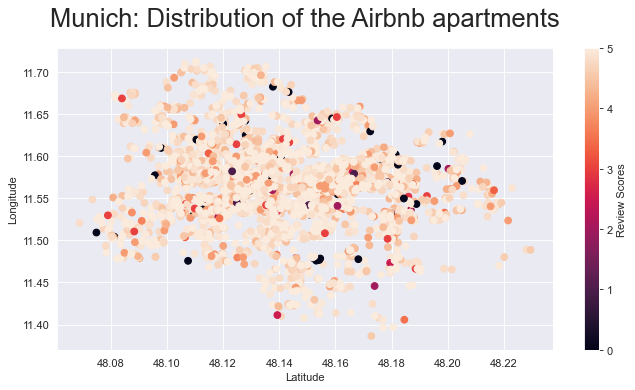

In [845]:
### Plotting the review scores of all apartments in Munich based on geo data.
fig_axes_geo() # Python Function

plt.scatter(data = df, x = 'latitude', y = 'longitude', c = 'review_scores_rating')
plt.colorbar(label = 'Review Scores')
plt.title('Munich: Distribution of the Airbnb apartments', fontsize=23, y=1.05)
plt.xlabel('Latitude')
plt.ylabel('Longitude')

# Saving picture
plt.savefig('plot_a1.png', dpi=300, bbox_inches = "tight");

> There is a lot of Airbnb data spread over Munich and which can be used to visualize it within a geographical map. <br><br>

### Assessing Summary

> 1. The data frame consits of 74 columns and 4995 rows.
> 2. The data frame contains NaN values.
> 3. The data frame contains 4 columns which values are all null.
> 4. The data frame contains missing values.
> 5. The data frame does NOT contain duplicate values.
> 6. The data frame contains data types which need to be changed.
> 7. The data frame contains columns/variables which need to be dropped.
> 8. Some values of the data frame have to be imputed.
> 9. Imputing the values of column `name` does NOT makes sense since the values are strings.
> 10. Imputing the values of column `host_since` does NOT makes sense since the values are firm dates.
> 11. Imputing the values of column `host_total_listings_count` does NOT makes sense since the values are precise quantitative information.
> 12. Imputing the values of column `bathrooms_text` does NOT makes sense since the values are precise information regarding furnishing.
> 13. The values of column `price` have to be changed from USD to EUR.

---

<a id='pre'></a>
## 3. Preparing Data
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

<a id='cle'></a>
### 3.A. Cleaning
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

**Cleaning** the data set to identify and fix any issues like incorrect, inaccurate, incomplete, incorrectly formatted, duplicated, or irrelevant data of the data set.<br><br>

In [846]:
# Copying the data frame.
df_copy = df

<br>

### 3.A.1. Dropping not needed columns

**Dropping** of irrelevant **columns**.<br><br>

#### Code

In [847]:
# Dropping not needed columns.
df_clean = df_copy.drop(['neighbourhood_group_cleansed',
                         'bathrooms',
                         'calendar_updated',
                         'license'], axis=1)

In [848]:
# Dropping rows with not needed NaN values in specific columns.
df_clean = df_clean.dropna(subset=['name',
                                   'host_since',
                                   'host_total_listings_count',
                                   'bathrooms_text'], how='any')

#### Test

In [849]:
# Checking if not needed columns are dropped.
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4976 entries, 0 to 4994
Data columns (total 70 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4976 non-null   int64  
 1   listing_url                                   4976 non-null   object 
 2   scrape_id                                     4976 non-null   int64  
 3   last_scraped                                  4976 non-null   object 
 4   name                                          4976 non-null   object 
 5   description                                   4804 non-null   object 
 6   neighborhood_overview                         2697 non-null   object 
 7   picture_url                                   4976 non-null   object 
 8   host_id                                       4976 non-null   int64  
 9   host_url                                      4976 non-null   o

In [850]:
# Checking for NaN values in specific column via function.
get_null_rows('name', df_clean) 

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month


In [851]:
# Checking for NaN values more detailed.
df_clean.isna().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
name                                               0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               1175
Length: 70, dtype: int64

> All of the irrelevant columns are dropped.<br><br>

<br>

### 3.A.2. Selecting necessary columns and creating final data set

**Creating** an new data frame of all relevant **columns**.<br><br>

#### Code

In [852]:
# Selecting all necessary columns.
df_clean = df_clean[['id',
                     'listing_url',
                     'name',
                     'host_since',
                     'host_response_time',
                     'host_response_rate',
                     'host_acceptance_rate',
                     'host_is_superhost',
                     'neighbourhood_cleansed',
                     'latitude',
                     'longitude',
                     'room_type',
                     'accommodates',
                     'bathrooms_text',
                     'bedrooms',
                     'beds',
                     'amenities',
                     'price',
                     'availability_30',
                     'availability_60',
                     'availability_90',
                     'availability_365',
                     'number_of_reviews',
                     'review_scores_rating',
                     'review_scores_cleanliness',
                     'review_scores_communication',
                     'review_scores_location',
                     'instant_bookable']]

#### Test

In [853]:
# Checking the count of columns of the data frame.
df_clean.shape[1]

28

In [854]:
# Checking if the data frame consists of the selected columns.
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4976 entries, 0 to 4994
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           4976 non-null   int64  
 1   listing_url                  4976 non-null   object 
 2   name                         4976 non-null   object 
 3   host_since                   4976 non-null   object 
 4   host_response_time           3117 non-null   object 
 5   host_response_rate           3117 non-null   object 
 6   host_acceptance_rate         3438 non-null   object 
 7   host_is_superhost            4976 non-null   object 
 8   neighbourhood_cleansed       4976 non-null   object 
 9   latitude                     4976 non-null   float64
 10  longitude                    4976 non-null   float64
 11  room_type                    4976 non-null   object 
 12  accommodates                 4976 non-null   int64  
 13  bathrooms_text    

> The new data frame with all relevant columns columns is created.<br><br>

<br> 

### 3.A.3. Changing the data types

**Changing** tha data types of some variables.<br><br>

#### Code

In [855]:
# Changing the dtype of the column.
df_clean['host_since'] = pd.to_datetime(df_clean['host_since'])

#### Test

In [856]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4976 entries, 0 to 4994
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           4976 non-null   int64         
 1   listing_url                  4976 non-null   object        
 2   name                         4976 non-null   object        
 3   host_since                   4976 non-null   datetime64[ns]
 4   host_response_time           3117 non-null   object        
 5   host_response_rate           3117 non-null   object        
 6   host_acceptance_rate         3438 non-null   object        
 7   host_is_superhost            4976 non-null   object        
 8   neighbourhood_cleansed       4976 non-null   object        
 9   latitude                     4976 non-null   float64       
 10  longitude                    4976 non-null   float64       
 11  room_type                    4976 non-null 

> The new date type is existing.<br><br>

<br> 

### 3.A.4. Reworking string values

**Reworking** the string values of some variables.<br><br>

#### Code

In [857]:
df_clean.host_response_rate[42]

'100%'

In [858]:
df_clean.host_acceptance_rate[42]

'50%'

In [859]:
# Removing the '%' sign from values and changing the dtype of the column.
df_clean['host_response_rate'] = df_clean['host_response_rate'].str.replace('\%', '')
df_clean['host_acceptance_rate'] = df_clean['host_acceptance_rate'].str.replace('\%', '')

#### Test

In [860]:
print(df_clean.host_response_rate[42])

100


In [861]:
print(df_clean.host_acceptance_rate[42])

50


> The string value has been adjusted.<br><br>

<br> 

### 3.A.5. Changing the acual currency USD into EUR

**Replacing** parts of the string value, data type and **changing** the currency.<br><br>

#### Code

In [862]:
# Defining variable with the previous data frame values of the 'price'.
df_clean_prev = df_clean
df_clean_prev_index = df_clean_prev[df_clean_prev['price'] == '$3,000.00'].index.values
print(df_clean_prev_index)

[564]


In [863]:
# Defining test variable
before = df_clean_prev['price'][564]

In [864]:
# Removing the '$' and ',' sign from values.
df_clean['price'] = df_clean['price'].map(lambda x: x.lstrip('$'))
df_clean['price'] = df_clean['price'].str.replace(',', '')

# Checking if TRUE values are existing with help of an example value.
df_clean_print = df_clean['price'] == '3000.00'
if df_clean_print.any() == True:
    print(df_clean_print.any().any()) # Result: Code passed.
else:
    print('No TRUE values existing.') # Result: Code has to be reworked.

True


In [865]:
# Removing the '.0' sign from values and changing the dtype of the column.
#df_clean['price'] = df_clean['price'].str.replace('\.0', '')

In [866]:
# Changing the dtype of the column.
df_clean['price'] = df_clean['price'].astype(float)

In [867]:
# Changing the currency value from USD into EUR.
df_clean['price'] = df_clean['price']/1.0408 # rate from 12 May 2022: EUR 1 = USD 1.0408
df_clean['price'] = df_clean['price'].round(0)

In [868]:
# Defining test variable
after = df_clean['price'][564]

In [869]:
df_clean.price.dtypes

dtype('float64')

#### Test

In [870]:
# Checking an example value BEFORE replacing parts of the string value and changing the currency unit.
print(before)


$3,000.00


In [871]:
# Checking an example value AFTER replacing parts of the string value and changing the currency unit.
print(after)

2882.0


> The string values, data types and the currency values are changed.<br><br>

<br> 

### 3.A.6. Imputing numerical an categorial values

**Imputing** all missing/NaN numerical and categorial values of the data frame.<br><br>

#### Code

In [872]:
# Defining test variable
before = sum(df_clean.host_response_time.isnull())

In [873]:
# Checking the number of categorical columns in the data frame.
df_clean.select_dtypes(include=['object']).shape[1] # Subset to a dataframe only holding the categorical columns

11

In [874]:
# Creating a data frame which only exists of the categrorial columns.
df_cat = df_clean.select_dtypes(include=['object'])
df_cat.head(3)

,listing_url,name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,room_type,bathrooms_text,amenities,instant_bookable
0,https://www.airbnb.com/rooms/97945,Deluxw-Apartm. with roof terrace,within a few hours,100,NaN,t,Hadern,Entire home/apt,1 bath,"[""Room-darkening shades"", ""Long term stays all...",f
1,https://www.airbnb.com/rooms/114695,Apartment Munich/East with sundeck,within a few hours,100,100,f,Berg am Laim,Entire home/apt,1 bath,"[""Long term stays allowed"", ""Hangers"", ""Smoke ...",f
2,https://www.airbnb.com/rooms/127383,City apartment next to Pinakothek,within a few hours,100,83,f,Maxvorstadt,Entire home/apt,1 bath,"[""Breakfast"", ""Hangers"", ""Smoke alarm"", ""Coffe...",f


In [875]:
# Imputing values for all CATEGORIAL  and NUMERICAL columns.
for i in df_clean.columns:
    if (df_clean[i].dtype == 'object'):
        df_clean[i] = df_clean[i].fillna(df_clean[i].mode()[0])
    if (df_clean[i].dtype == 'int64'):
        df_clean[i] = df_clean[i].fillna(df_clean[i].median())
    elif (df_clean[i].dtype == 'float64'):
        df_clean[i] = df_clean[i].fillna(df_clean[i].median())

#### Test

In [876]:
# Checking an example value BEFORE replacing parts of the string value and changing the currency unit.
print(before)

1859


In [877]:
# Checking an example value AFTER replacing parts of the string value and changing the currency unit.
after = sum(df_clean.host_response_time.isnull())
print(after)

0


In [878]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4976 entries, 0 to 4994
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           4976 non-null   int64         
 1   listing_url                  4976 non-null   object        
 2   name                         4976 non-null   object        
 3   host_since                   4976 non-null   datetime64[ns]
 4   host_response_time           4976 non-null   object        
 5   host_response_rate           4976 non-null   object        
 6   host_acceptance_rate         4976 non-null   object        
 7   host_is_superhost            4976 non-null   object        
 8   neighbourhood_cleansed       4976 non-null   object        
 9   latitude                     4976 non-null   float64       
 10  longitude                    4976 non-null   float64       
 11  room_type                    4976 non-null 

> All missing/NaN numeric and categorical values of the data frame were imputed. There are no more NaN values.<br><br>

### Defining new Data Frame

In [879]:
# Defining new data set.
df_new = df_clean.copy()

### Exporting new Data Frame

In [880]:
# Exporting the new data frame as .csv.
df_new.to_csv('airbnb_munich.csv', index=False)

> * Finally the **cleaned** data frame `df_new` can be **used** for **model the data**.

---

<a id='mod'></a>
## 4. Model Data
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

<a id='atq'></a>
### 4.A. Answering the Questions.
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

**Analyse** the data to answer the questions.<br><br>

<br>
<a id='qu1'></a>

### Question: 1. Will I quickly find a suitable apartment in Munich?


<br>

**Defining** a new data frame of the data to group it and count the quantity.

In [881]:
# Counting the amount of values and defining new data frame.
df_q1 = df_new.groupby('instant_bookable').agg({'id':'count'})
df_q1

,id
instant_bookable,
f,3582
t,1394


<br>

**Defining** the relative values [%] of the data.

In [882]:
# Defining the variable for the plot.
df_q1['id_perc'] = (df_q1['id']/df_q1['id'].sum())*100
df_q1 = df_q1['id_perc']

In [883]:
# Checking the ratio of the defined variable.
df_q1.head()

instant_bookable
f    71.985531
t    28.014469
Name: id_perc, dtype: float64

<br>

**Plotting** a pie chart of the booking possibility and saving it as a picture.

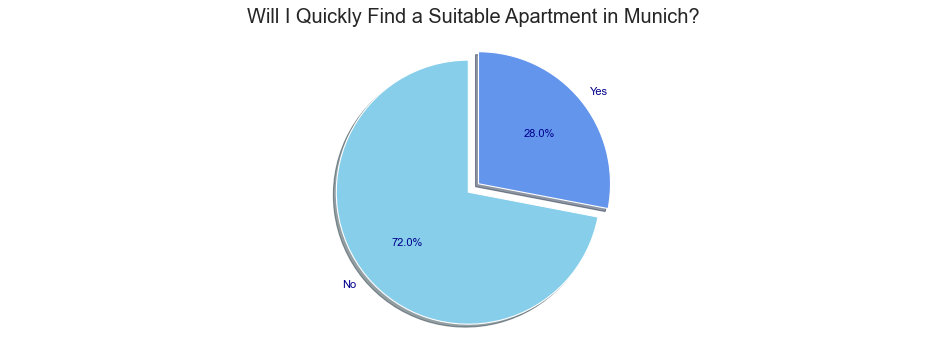

In [884]:
# Plotting the immediate booking possibility of apartments.
fig_axes() # Python Function

# Defining plot variables.
plot_labels = 'No', 'Yes'
plot_base_color = ['skyblue', 'cornflowerblue']
plot_explode = (0.1, 0)  # Exploding the 2 slices (gap)

# Defining plot.
plt.pie(df_q1, explode=plot_explode, labels=plot_labels, autopct='%1.1f%%', shadow=True, 
        startangle=90, colors=plot_base_color, textprops=dict(color="darkblue"))
plt.axis('equal')  # Ensuring that pie is drawn as a circle.

# Defining title
plt.title('Will I Quickly Find a Suitable Apartment in Munich?', fontsize=18, y=1.03)

# Saving picture
plt.savefig('plot_q1.png', dpi=300);

> **Q1 - Answer:** The answer ist No. It is not possible to quickly find an apartment in Munich. Only 28 % of the offered apartments are available immediatly.<br><br>

---

<br>
<a id='qu2'></a>

### Question: 2. Which district is the most chosen one based on the best ratings?

<br>

**Defining** a new data frame of the data.

In [885]:
# Defining new data frame.
df_q2 = df_new
df_q2.head(1)

,id,listing_url,name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_cleanliness,review_scores_communication,review_scores_location,instant_bookable
0,97945,https://www.airbnb.com/rooms/97945,Deluxw-Apartm. with roof terrace,2011-04-18,within a few hours,100,100,t,Hadern,48.11492,11.48954,Entire home/apt,2,1 bath,1.0,1.0,"[""Room-darkening shades"", ""Long term stays all...",77.0,0,1,2,22,129,4.84,4.82,4.93,4.78,f


<br>

**Defining** a new data frame of the data.

In [886]:
# Creating new data frame.
df_q2 = df_q2[['listing_url',
               'name',
               'neighbourhood_cleansed',
               'review_scores_rating',
               'longitude',
               'latitude']]
df_q2.head(3)

,listing_url,name,neighbourhood_cleansed,review_scores_rating,longitude,latitude
0,https://www.airbnb.com/rooms/97945,Deluxw-Apartm. with roof terrace,Hadern,4.84,11.48954,48.11492
1,https://www.airbnb.com/rooms/114695,Apartment Munich/East with sundeck,Berg am Laim,4.77,11.63758,48.12071
2,https://www.airbnb.com/rooms/127383,City apartment next to Pinakothek,Maxvorstadt,4.86,11.56482,48.15199


**Filtering** and creating a new data frame of the data.<br><br>

In [887]:
# Filtering of the best 'review_scores_rating'.
df_q2 = df_q2[(df_q2.review_scores_rating >= 5.00)]
df_q2.head(3)

,listing_url,name,neighbourhood_cleansed,review_scores_rating,longitude,latitude
40,https://www.airbnb.com/rooms/199821,Pure Luxury in trendy Maxvorstadt,Maxvorstadt,5.0,11.57544,48.15110
88,https://www.airbnb.com/rooms/280995,Very beautifully furnished 1-room Apartment,Milbertshofen-Am Hart,5.0,11.56679,48.17877
91,https://www.airbnb.com/rooms/311198,Guest First! Munich-Center Led,Altstadt-Lehel,5.0,11.58079,48.13613


<br>

**Grouping** the data frame and count the amount per neighborhood.

In [888]:
# Counting the amount of values and defining new data frame.
df_q2_grouped = df_q2.groupby('neighbourhood_cleansed').agg({'neighbourhood_cleansed':'count'})
df_q2_grouped = df_q2_grouped.neighbourhood_cleansed.sort_values(ascending=False)
df_q2_grouped.head(3)

neighbourhood_cleansed
Ludwigsvorstadt-Isarvorstadt    144
Au-Haidhausen                   106
Schwabing-West                  101
Name: neighbourhood_cleansed, dtype: int64

In [889]:
# Checking the dictionary to get the keys.
#df_q2_dict = df_q2_grouped.to_dict()
print("0", df_q2_grouped.keys()[0])
print("1", df_q2_grouped.keys()[1])
print("2", df_q2_grouped.keys()[2])

0 Ludwigsvorstadt-Isarvorstadt
1 Au-Haidhausen
2 Schwabing-West


<br>

**Filtering** the data frame to get the first three values for the neighbourhood.

In [890]:
# Filtering the data frame.
df_q2 = df_q2[(df_q2.neighbourhood_cleansed == df_q2_grouped.keys()[0])
             |(df_q2.neighbourhood_cleansed == df_q2_grouped.keys()[1])
             |(df_q2.neighbourhood_cleansed == df_q2_grouped.keys()[2])]
df_q2.head(3)

,listing_url,name,neighbourhood_cleansed,review_scores_rating,longitude,latitude
97,https://www.airbnb.com/rooms/406404,Holiday Flat in Munich Schwabing,Schwabing-West,5.0,11.58283,48.17723
150,https://www.airbnb.com/rooms/774834,★ Soul space ★ whole appartment in top area,Au-Haidhausen,5.0,11.57356,48.12266
159,https://www.airbnb.com/rooms/910680,CHARMING LOVESOME ALTBAU KAISERSTR!,Schwabing-West,5.0,11.57744,48.16025


<br>

**Defining** the colors per neighborhood.

In [891]:
# HELPER FUNCTION
# Defining function for colors.
# (Source of code parts: https://youtu.be/FdqDgoG-SFM)
def f_poi_col(row):
    if row['neighbourhood_cleansed'] == df_q2_grouped.keys()[0]:
        return 'green'
    elif row['neighbourhood_cleansed'] == df_q2_grouped.keys()[1]:
        return 'blue'
    elif row['neighbourhood_cleansed'] == df_q2_grouped.keys()[2]:
        return 'darkpurple'
    return 'lightgray'

<br>

**Creating** an interactive map to visualize each apartment of the filtered values.

In [892]:
# Visualizing an interactice map with the best rated district.
# (Source of code parts: https://youtu.be/FdqDgoG-SFM)

# Creating new column for POI Color.
df_q2['poi_col'] = df_q2.apply(f_poi_col, axis=1)

# Creating an interactive map with python library folium
q2_map = folium.Map(zoom_start=12.5,
                    location=[48.149769, 11.574605],
                    tiles='CartoDB positron')

# Locating the review score ratings based on latitude and longitude data.
ratings = df_q2.iloc[0]

for _, ratings in df_q2.iterrows():
    html = f"""
        <p><b>Airbnb Apartment - Review Scores equal to or greater than 5.00 scores</b></p>
        <p>Click link to get externally forwarded to the Airbnb apartment:</p>
        <a href="{ratings['listing_url']}" target="_blank">{ratings['listing_url']}</a>
       """
    q2_marker = folium.Marker(location=[ratings['latitude'], 
                                        ratings['longitude']],
                                        popup=html,
                                        tooltip=ratings['name'],
                                        icon=folium.Icon(color=ratings['poi_col'], prefix='fa', icon='circle'))
    q2_map_final = q2_marker.add_to(q2_map)
    q2_map_final
q2_map

<br>

**Saving** the interactive map as a html file.

In [893]:
# Saving html page and picture
q2_map_final.save('q2_map.html')

---

<br>
<a id='qu3'></a>

### Question: 3. Which apartments are not attractive at all in Munich?

<br>

**Defining** a new data frame of the data.

In [894]:
# Defining new data frame.
df_q3 = df_new
df_q3.head(1)

,id,listing_url,name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_cleanliness,review_scores_communication,review_scores_location,instant_bookable
0,97945,https://www.airbnb.com/rooms/97945,Deluxw-Apartm. with roof terrace,2011-04-18,within a few hours,100,100,t,Hadern,48.11492,11.48954,Entire home/apt,2,1 bath,1.0,1.0,"[""Room-darkening shades"", ""Long term stays all...",77.0,0,1,2,22,129,4.84,4.82,4.93,4.78,f


<br>

**Visualizing** the distribution of the Airbnb user review scores.

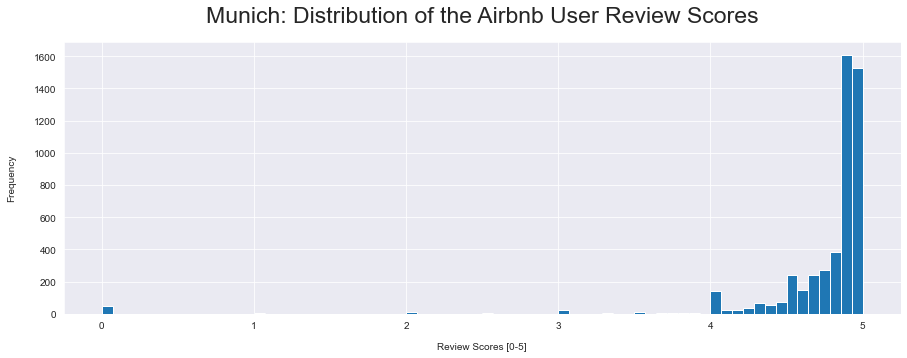

In [895]:
# Checking the distribution of the ratings with help of a histogramm.
df_q3.review_scores_rating.hist(bins=70, figsize=(15, 5))

# Defining title and lables
plt.title('Munich: Distribution of the Airbnb User Review Scores', fontsize=23, y=1.05)
plt.xlabel('Review Scores [0-5]', labelpad=12)
plt.ylabel('Frequency', labelpad=18)

# Saving picture
plt.savefig('plot_q3_1.png', dpi=300, bbox_inches = "tight");

<br>

**Counting** the old data frame with filtering everything but the worst review scores.

In [896]:
df_q3_old = df_q3[(df_q3.review_scores_rating > 2.00)]
df_q3_old_count = df_q3_old.name.count()
df_q3_old_count

4908

In [897]:
# Creating new data frame.
df_q3 = df_q3[(df_q3.review_scores_rating <= 2.00)]
df_q3 = df_q3[['name',
               'listing_url',
               'review_scores_rating',
               'longitude',
               'latitude']]
df_q3.head(3)

,name,listing_url,review_scores_rating,longitude,latitude
253,2 Room App. near Viktualienmarkt,https://www.airbnb.com/rooms/1651743,2.0,11.57856,48.13204
486,Alpes-Panaroma view over munich,https://www.airbnb.com/rooms/5031783,0.0,11.61704,48.19807
647,Wiesn Himmel,https://www.airbnb.com/rooms/8333316,0.0,11.51215,48.13799


<br>

**Counting** the amount of apartments while filtering the worst review scores.

In [898]:
# Counting the amount of apartments.
df_q3_count = df_q3.name.count()
df_q3_count

68

<br>

**Calculating** the ratio compared to the whole amount of apramtens.


In [899]:
# Claculating the ratio compared to the whole amount.
df_q3_ratio = 100*(df_q3_count/df_q3_old_count)
df_q3_ratio

1.3854930725346373

<br>

**Function** to help to set the right colors for the markers within the map.

In [900]:
# HELPER FUNCTION
# Defining function for colors.
# (Source of code parts: https://youtu.be/FdqDgoG-SFM)
def f_poi_col_2(row):
    if row['review_scores_rating'] <= 2.00:
        return 'red'
    elif row['review_scores_rating'] >2.00 and row['review_scores_rating'] <= 3.00:
        return 'orange'
    elif row['review_scores_rating'] >3.00 and row['review_scores_rating'] <= 4.00:
        return 'beige'
    elif row['review_scores_rating'] >4.00 and row['review_scores_rating'] < 5.00:
        return 'blue'
    return 'green'

<br>

**Creating** an interactive map to visualize each apartment of the filtered values.

In [901]:
# Visualizing an interactice map with the worst rated apartments.
# (Source of code parts: https://youtu.be/FdqDgoG-SFM)

# Creating new column for POI Color.
df_q3['poi_col'] = df_q3.apply(f_poi_col_2, axis=1)

# Creating an interactive map with python library folium
q3_map = folium.Map(zoom_start=11.5,
                    location=[48.145349, 11.574739],
                    tiles='CartoDB positron')

# Locating the review score ratings based on latitude and longitude data.
ratings = df_q3.iloc[0]

for _, ratings in df_q3.iterrows():
    html = f"""
        <p><b>Airbnb Apartment - Review Scores equal to or less than 2.00 scores</b></p>
        <p>Click link to get externally forwarded to the Airbnb apartment:</p>
        <p><a href="{ratings['listing_url']}" target="_blank">{ratings['listing_url']}</a></p>
       """
    q3_map_marker = folium.Marker(location=[ratings['latitude'], 
                                            ratings['longitude']],
                                            popup=html,
                                            tooltip=ratings['name'],
                                            icon=folium.Icon(color=ratings['poi_col'], prefix='fa', icon='circle'))
    q3_map_final = q3_map_marker.add_to(q3_map)
    q3_map_final
q3_map

<br>

**Saving** the interactive map as a html file.

In [902]:
q3_map_final.save('q3_map.html')

---

<br>
<a id='qu4'></a>

### Question: 4. What features are contributing to estimate the price of an apartment?

<br>

**Defining** a new data frame of the data.

In [903]:
# Defining new data frame.
df_q4 = df_new
df_q4.head(1)

,id,listing_url,name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_cleanliness,review_scores_communication,review_scores_location,instant_bookable
0,97945,https://www.airbnb.com/rooms/97945,Deluxw-Apartm. with roof terrace,2011-04-18,within a few hours,100,100,t,Hadern,48.11492,11.48954,Entire home/apt,2,1 bath,1.0,1.0,"[""Room-darkening shades"", ""Long term stays all...",77.0,0,1,2,22,129,4.84,4.82,4.93,4.78,f


<br>

**Checking** and plotting the histograms of every numerical variable of the data.

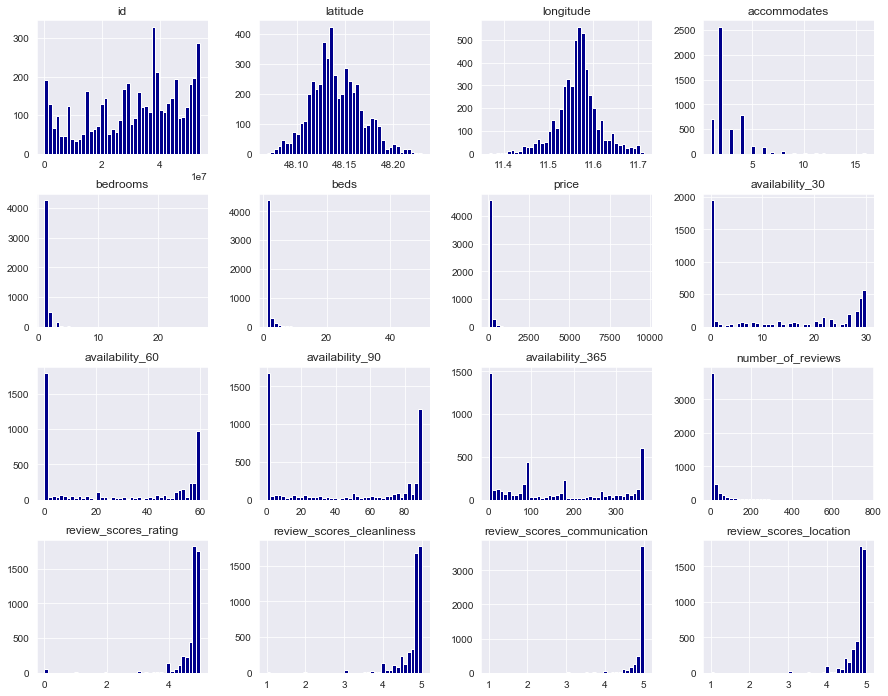

In [904]:
#### Plotting a histogram of the data frame.
df_q4.hist(bins=42, grid=True, figsize=(15,12), color='darkblue')

# Saving picture
plt.savefig('plot_q4_1.png', dpi=300);

<br>

**Checking** and plotting the price distribution of the apartments.

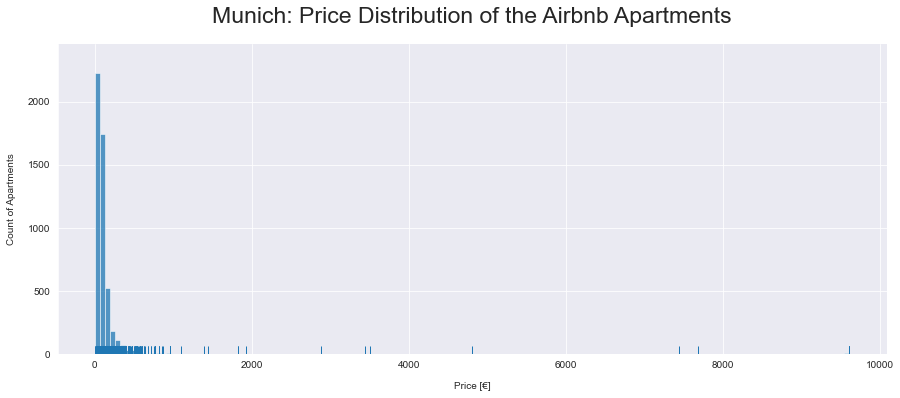

In [905]:
# Plotting the price distribution.
sns.displot(df_q4['price'], bins=150, height=5, aspect=2.5, rug=True);

# Defining title and lables
plt.title('Munich: Price Distribution of the Airbnb Apartments', fontsize=23, y=1.05)
plt.xlabel('Price [€]', labelpad=12)
plt.ylabel('Count of Apartments', labelpad=12)

# Saving picture
plt.savefig('plot_q4_2.png', dpi=300, bbox_inches = "tight");

<br>

**Checking** and plotting the neighbourhood district of the apartments correlated to the price.

In [906]:
# Getting an array of all room types.
df_q4_room = df_q4['room_type'].unique()
df_q4_room

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

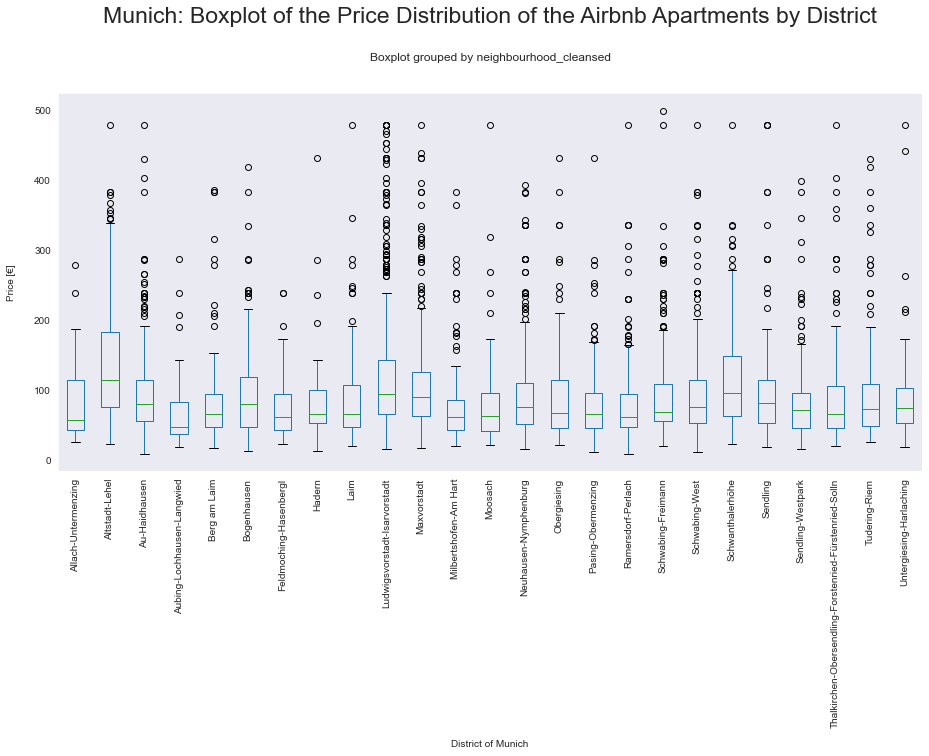

In [907]:
# Plotting a histogram to see the price distribution over the district.
df_q4_box = df_q4[df_q4['price'] <= 500] # Removing Outliers
df_q4_box = df_q4_box.boxplot(column='price', by='neighbourhood_cleansed', figsize=(15,7), rot=90, grid=False)

# Defining title and lables
plt.title('Munich: Boxplot of the Price Distribution of the Airbnb Apartments by District', fontsize=23, y=1.17)
plt.xlabel('District of Munich', labelpad=12)
plt.ylabel('Price [€]', labelpad=18)

# Saving picture
plt.savefig('plot_q4_3.png', dpi=300, bbox_inches = "tight");

<br>

**Checking** and plotting the room types of the apartments correlated to the price.

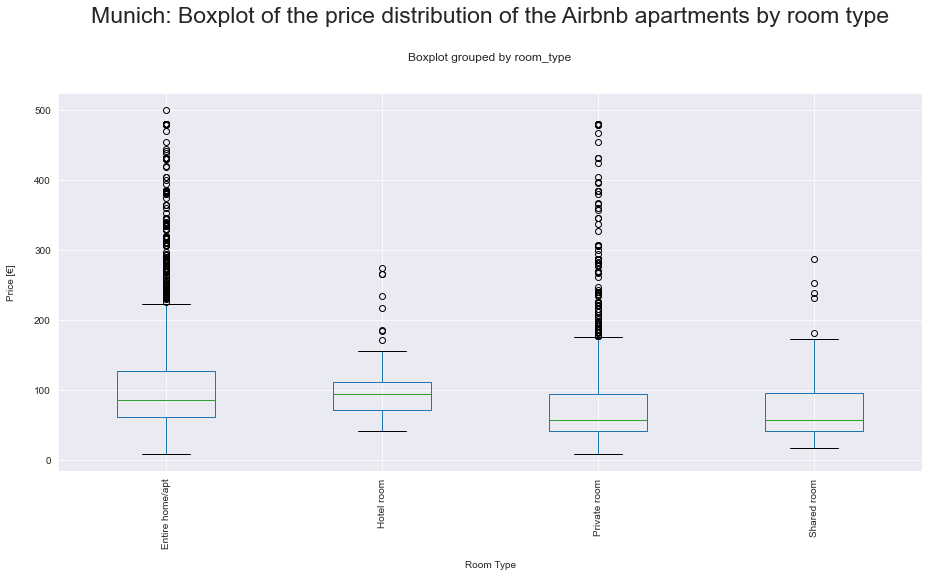

In [908]:
# Plotting a histogram to see the price distribution over the district.
df_q4_box = df_q4[df_q4['price'] <= 500] # Removing outliers
df_q4_box.boxplot(column='price', by='room_type', figsize=(15,7), rot=90, grid=True)

# Defining title and lables
plt.title('Munich: Boxplot of the price distribution of the Airbnb apartments by room type', fontsize=23, y=1.17)
plt.xlabel('Room Type', labelpad=12)
plt.ylabel('Price [€]', labelpad=18)

# Saving picture
plt.savefig('plot_q4_4.png', dpi=300, bbox_inches = "tight");

<br>

**Checking** and plotting the price distribution of the apartments correlated to the rating score.

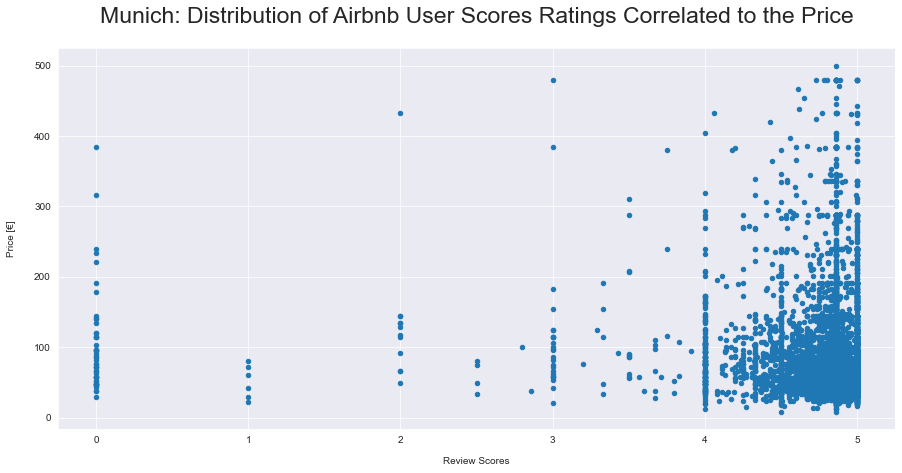

In [909]:
# Plotting a scatterplot to see the price distribution over the rating score.
df_q4_box = df_q4[df_q4['price'] <= 500] # Removing outliers
df_q4_box.plot.scatter(x='review_scores_rating', y='price', figsize=(15,7))

# Defining title and lables
plt.title('Munich: Distribution of Airbnb User Scores Ratings Correlated to the Price', fontsize=23, y=1.05)
plt.xlabel('Review Scores', labelpad=12)
plt.ylabel('Price [€]', labelpad=18)

# Saving picture
plt.savefig('plot_q4_5.png', dpi=300, bbox_inches = "tight");

<br>

**Defining** a new data frame of the data.

In [910]:
# Dropping all unnecessary columns.
df_q4 = df_q4.drop(['listing_url',
                    'name',
                    'latitude',
                    'longitude',
                    'host_since',
                    'host_response_time',
                    'host_response_rate',
                    'host_acceptance_rate',
                    'host_is_superhost',
                    'availability_30',
                    'availability_60',
                    'availability_90',
                    'availability_365',], axis=1)

In [911]:
# Checking the data type of the data frame.
df_q4.dtypes

id                               int64
neighbourhood_cleansed          object
room_type                       object
accommodates                     int64
bathrooms_text                  object
bedrooms                       float64
beds                           float64
amenities                       object
price                          float64
number_of_reviews                int64
review_scores_rating           float64
review_scores_cleanliness      float64
review_scores_communication    float64
review_scores_location         float64
instant_bookable                object
dtype: object

<br>

**Function** to help to create the data frame including dummies as a preparation for the machine learning model.

In [912]:
# Defining function to create a list of the column names of the categorical variables.
# (Source of code parts: Udacity - Data Scientist Nanodegree Program)
def f_create_dummy_df(df, cat_cols, dummy_na):
    '''
    INPUT:
    df - Pandas data frame with categorical variables to create dummis.
    cat_cols - List of names (strings) of the categorical columns.
    dummy_na - Bool holding whether you want to dummy NA vals of categorical columns or not
    
    OUTPUT:
    df - New dataframe of the following characteristics:
            1. Contains all not categorical columns.
            2. Removes the original columns in cat_cols (all).
            3. Dummy each categorical columns in cat_cols.
            4. dummy_na == TRUE - It does contain dummy columns for NaN values.
            5. Prefix of the column name: Underscore (_) for separating. 
    '''
    for col in  cat_cols:
        try:
            # for each cat add dummy var, drop original column
            df = pd.concat([df.drop(col, axis=1), pd.get_dummies(df[col], prefix=col, prefix_sep='_', drop_first=True, dummy_na=dummy_na)], axis=1)
        except:
            continue
    return df

In [913]:
# # Checking the size of the ACTUAL data frame (rows, columns).
df_q4.shape

(4976, 15)

<br>

**Creating** a new data frame including the dummies for all categorial variables.

In [914]:
# Creating a new data frame (list) with categorial variables.
df_q4_cat = df_q4.select_dtypes(include=['object'])
df_q4_cat_cols = df_q4_cat.columns

df_q4_new = f_create_dummy_df(df_q4, df_q4_cat_cols, dummy_na=False) #Use your newly created function

# # Checking the size of the NEW data frame (rows, columns).
df_q4_new.shape

(4976, 4778)

<br>

**Function** to create the machine learning model that can be used to predict the influences of the house price.

In [915]:
# Defining function to create a machine learning model.
# (Source of code parts: Udacity - Data Scientist Nanodegree Program)
def f_fit_linear_mod(df, response_col, cat_cols, dummy_na, test_size=.3, rand_state=42):
    '''
    INPUT:
    df - Data frame containing all intersting variables.
    response_col - Name (string) of the column.
    cat_cols - List names (strings) of the categorical columns.
    dummy_na - dummy_na == TRUE - It does contain dummy columns for NaN values.
    test_size - Float between [0,1] about what proportion of data should be in the test dataset.
    rand_state - An int that is provided as the random state for splitting the data into training and test .
    
    OUTPUT:
    test_score - float - r2 score on the test data.
    train_score - float - r2 score on the test data.
    lm_model - Model object from sklearn.
    X_train, X_test, y_train, y_test - Output from sklearn train test split used for optimal model.
    
    Functionality:

    1. Splitting data into an X matrix and a response vector y.
    2. Creating training and test sets of data.
    3. Instantiating a LinearRegression model with normalized data.
    4. Fitting the model to the training data.
    5. Predicting the response for the training data and the test data.
    10. Obtain an rsquared value for both the training and test data
    '''

    #Splitting data into explanatory and response variables.
    X = df.drop(response_col, axis=1)
    y = df[response_col]

    #Splitting data into train data and test data.
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=rand_state)

    # Instantiate and fiting the LinearRegression model.
    lm_model = LinearRegression(normalize=True) # Instantiate
    lm_model.fit(X_train, y_train) #Fit

    #Predict using your model
    y_test_preds = lm_model.predict(X_test)
    y_train_preds = lm_model.predict(X_train)
 
    #Score using your model
    test_score = r2_score(y_test, y_test_preds)
    train_score = r2_score(y_train, y_train_preds)

    return X, y, test_score, train_score, lm_model, X_train, X_test, y_train, y_test


<br>

**Checking** the Rsquared of the machine learning model train data and test data.

In [916]:
# Using function with the data frame.
X, y, test_score, train_score, lm_model, X_train, X_test, y_train, y_test = f_fit_linear_mod(df_q4_new, 'price', df_q4_cat_cols, dummy_na=False)


In [917]:
# Printing training and testing score.
print("The rsquared TEST data: {}.  The rsquared TRAIN data: {}.".format(test_score, train_score))


The rsquared TEST data: -5.871764152231999e+27.  The rsquared TRAIN data: 0.8270328647365479.


> The big delta between of the test data and train data shows, that the machine learning model is **OVERFITTING**. <br>
> **Conclusion**: It is necessary to optimize the machine learning model.

<br>

**Function** to OPTIMIZE the Rsquared of the machine learning model train data and test data considerung cutoffs.

In [918]:
# HELPER FUNCTION
# Defining function to create an OPTIMAL machine learning model.
# (Source of code parts: Udacity - Data Scientist Nanodegree Program)
def f_find_optimal_lm_mod(X, y, cutoffs, test_size = .3, random_state=42, plot=True):
    '''
    INPUT
    X - Pandas data frame, X matrix.
    y - Pandas data frame, response variable.
    cutoffs - List of ints and cutoff for number of non-zero values in dummy categorical vars.
    test_size - Float between 0 and 1, default 0.3, determines the proportion of data as test data.
    random_state - An int, default 42, controls random state for train_test_split.
    plot - Boolean, default 0.3, True to plot result.

    OUTPUT
    r2_scores_test - float - r2 score on the test data.
    r2_scores_train - float - r2 score on the test data.
    lm_model - Model object from sklearn.
    X_train, X_test, y_train, y_test - Output from sklearn train test split used for optimal model.
    '''
    r2_scores_test, r2_scores_train, num_feats, results = [], [], [], dict()
    for cutoff in cutoffs:

        # Reducing X matrix.
        reduce_X = X.iloc[:, np.where((X.sum() > cutoff) == True)[0]]
        num_feats.append(reduce_X.shape[1])

        # Split the data into train data and test data.
        X_train, X_test, y_train, y_test = train_test_split(reduce_X, y, test_size = test_size, random_state=random_state)

        # Fitting the model and obtain pred response.
        lm_model = LinearRegression(normalize=True)
        lm_model.fit(X_train, y_train)
        y_test_preds = lm_model.predict(X_test)
        y_train_preds = lm_model.predict(X_train)

        # Appending the r2 value from the test set.
        r2_scores_test.append(r2_score(y_test, y_test_preds))
        r2_scores_train.append(r2_score(y_train, y_train_preds))
        results[str(cutoff)] = r2_score(y_test, y_test_preds)

    if plot:
        plt.plot(num_feats, r2_scores_test, label="Test", alpha=.5)
        plt.plot(num_feats, r2_scores_train, label="Train", alpha=.5)
        plt.xlabel('Number of Features')
        plt.ylabel('Rsquared')
        plt.title('Rsquared by Number of Features')
        plt.legend(loc=1)
        plt.show()

    best_cutoff = max(results, key=results.get)

    # Reduce X matrix.
    reduce_X = X.iloc[:, np.where((X.sum() > int(best_cutoff)) == True)[0]]
    num_feats.append(reduce_X.shape[1])

    # Split the data into train data and test data.
    X_train, X_test, y_train, y_test = train_test_split(reduce_X, y, test_size = test_size, random_state=random_state)

    # Fitting the model.
    lm_model = LinearRegression(normalize=True)
    lm_model.fit(X_train, y_train)

    return r2_scores_test, r2_scores_train, lm_model, X_train, X_test, y_train, y_test
            


In [919]:
# Cutoffs is the number of missing values allowed in the used columns.
# Lower values for the cutoff provides more predictors in the model for the X matrix.
cutoffs = [4500, 4000, 3500, 3000, 2500, 2000, 1500, 1000, 100, 90]

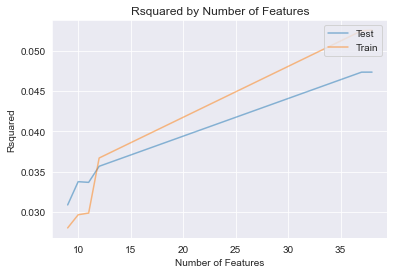

In [920]:
# Using OPTIMIZE function with the created data frame.
r2_scores_test, r2_scores_train, lm_model, X_train, X_test, y_train, y_test = f_find_optimal_lm_mod(X, y, cutoffs)


<br>

**Calculating** the number of columns and the best rsquared of the test data and the training data.

In [921]:
# Showing the numbers of columns of the machine learning model.
q4_lm_shape_x = X_train.shape[1] #Number of columns
q4_lm_shape_x

38

In [922]:
# Showing the Rsquared for TEST and TEST, which should be implemented.
q4_lm_shape_r2_test = r2_scores_test[np.argmax(r2_scores_test)]
q4_lm_shape_r2_train = r2_scores_train[np.argmax(r2_scores_test)]

In [923]:
# Printing training and testing score.
print('BEST rsquared TRAIN data VALUE: : {}\
     \nBEST rsquared TEST data VALUE: {}'.format(q4_lm_shape_r2_test, q4_lm_shape_r2_train))
    

BEST rsquared TRAIN data VALUE: : 0.04733761722381358     
BEST rsquared TEST data VALUE: 0.052532670090236655


<br>

**Function** to calculate the coefficiants of the X-features to see which ones matter the most in the machine learning model It is necessary, because a rich regression model is used.

In [924]:
# HELPER FUNCTION
# Finding out which x-fetaures doe matter in the linear model.
# (Source of code parts: Udacity - Data Scientist Nanodegree Program)

def coef_weights(coefficients, X_train):
    '''
    INPUT:
    coefficients - Coefficients of the linear model.
    X_train - Training data for using the column names.
    OUTPUT:
    coefs_df - Data frame of the coefficient, estimate, and abs(estimate).
    
    Provides a dataframe that can be used to understand the most influential coefficients
    in a linear model by providing the coefficient estimates along with the name of the 
    variable attached to the coefficient.
    '''
    coefs_df = pd.DataFrame()
    coefs_df['est_int'] = X_train.columns
    coefs_df['coefs'] = lm_model.coef_
    coefs_df['abs_coefs'] = np.abs(lm_model.coef_)
    coefs_df = coefs_df.sort_values('abs_coefs', ascending=False)
    return coefs_df


<br>

**Calculating** the coefficiants of the X-features and printing a list for further investigations.

In [925]:
# Use the function
df_q4_coef = coef_weights(lm_model.coef_, X_train)

# Providing an overview of the results.
df_q4_coef.head(20)

,est_int,coefs,abs_coefs
22,neighbourhood_cleansed_Schwabing-Freimann,112.567151,112.567151
14,neighbourhood_cleansed_Ludwigsvorstadt-Isarvor...,80.680625,80.680625
24,neighbourhood_cleansed_Schwanthalerhöhe,55.637042,55.637042
36,bathrooms_text_2 baths,54.080279,54.080279
32,bathrooms_text_1 private bath,53.899321,53.899321
37,instant_bookable_t,50.892152,50.892152
9,neighbourhood_cleansed_Altstadt-Lehel,46.676316,46.676316
12,neighbourhood_cleansed_Bogenhausen,46.634479,46.634479
19,neighbourhood_cleansed_Obergiesing,43.080502,43.080502
10,neighbourhood_cleansed_Au-Haidhausen,39.074846,39.074846


In [926]:
# Saving picture
dfi.export(df_q4_coef, 'plot_q4_6.png')

---

<a id='etr'></a>
## 5. Evaluate the Results
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

<a id='con'></a>
### 5.A. Conclusions
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

<br>

#### Question: 1. Will I quickly find a suitable apartment in Munich?

I make a last-minute decision to travel somewhere. And if it is a bigger city I always ask myself, if it is possible to find an apartment within 2 to 3 days before departing. Of course in the most interesting district of the town and for an appropriate price and good quality.

In big cities I expect first of all a huge variety of corresponding offers and second a big market which leads to an appropriate price. 

But how is it actually in the city where I live? In Munich.



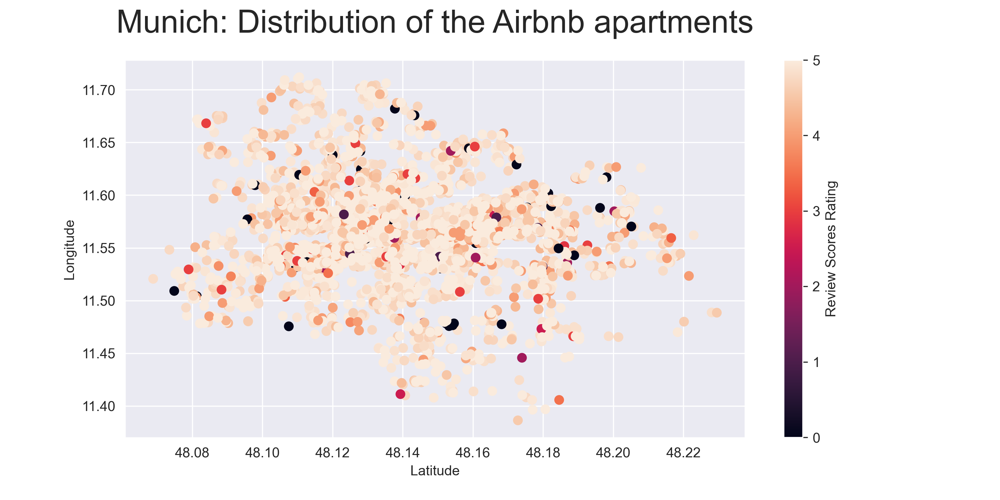

Well. There are a lot of **Airbnb** apartments in **Munich** available. Nothing new, I guess. But at least there where **4,995 apartments registered**, based on the dataset _(Date Compiled: 24 December, 2021)_ I chose for my analysis. 


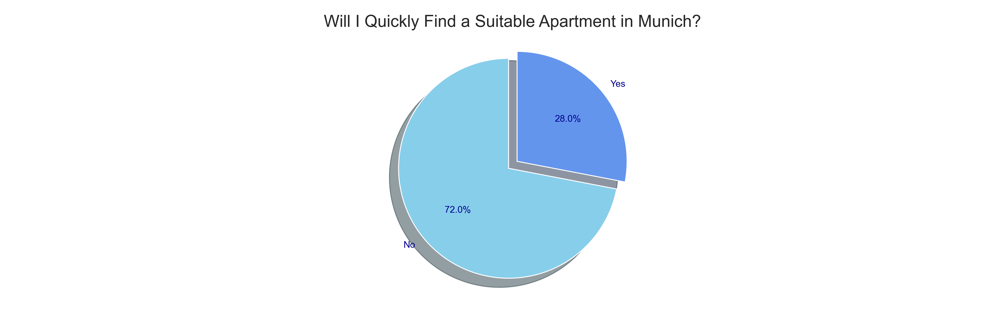

Based on the "instant bookable" feature, the result of the analysis is clear. 

> **It is not possible to find an apartment within a few days.**

But there is always luck.<br>
In any case, I suggest planning your trip to Munich a few days earlier.

---

<br>

#### Question: 2. Which district is the most chosen one based on the best ratings?

Usually I like to travel without a car. I love car driving, but cities I like to explore by foot. About Munich I would like to know if I would have to travel a lot to arrive my final destination from the Munich central station. Are there neighbouring districts around the central station which have good user score ratings? Let´s have a look at the result in the following interactive map.

>* <span style="color:yellowgreen"><b>Ludwigsvorstadt-Isarvorstadt</b><br> 144 registered apartments</span><br><br>
>* <span style="color:skyblue"><b>Au-Haidhausen</b><br> 106 registered apartments</span><br><br>
>* <span style="color:indigo"><b>Schwabing-West</b><br> 101 registered apartments</span>

<br><br>
And in fact there are some apartments next to the central station with very good user score rating _(equal to or greater than 5.00 scores)_.

>* But the majority is distributed in the closest district called **Ludwigsvorstadt-Isarvorstadt**.<br>
>* Followed by **Au-Haidhausen** on the other side of the river Isar.<br>
>* And a little bit north of the central station there is **Schwabing-West**. Not far away from the park called **Englischer Garten**. 
<br>

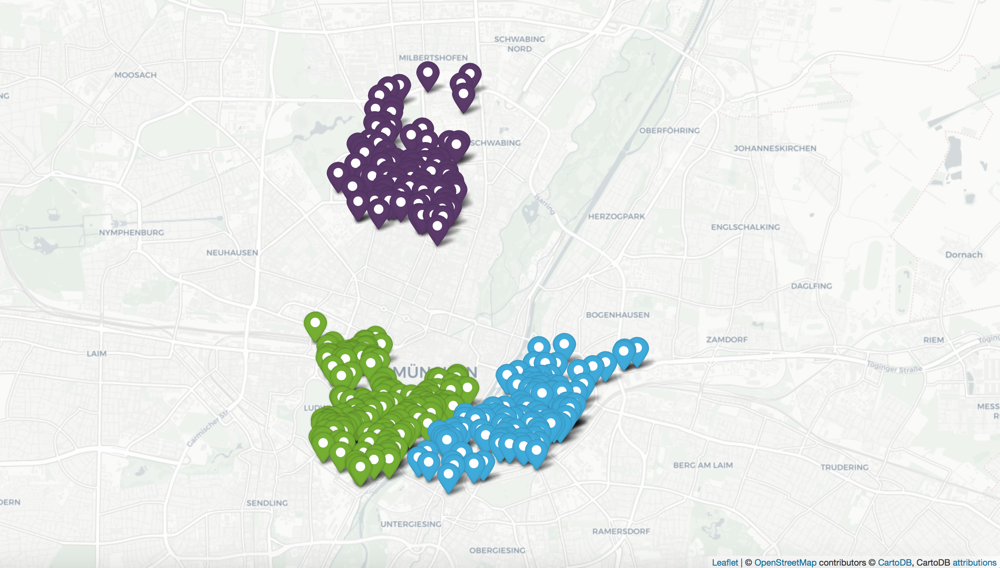

---

<br>

#### Question: 3. Which apartments are not attractive at all in Munich?

Now we come to the black sheep. Who does not know them. They are everywhere.
Yes, I definitely would not want to rent a less aesthetic or even dirty apartment. And I definitely want interact with a reliable and communicative host.<br>

Let us have a first look at the distribution of Airbnb user review scores in Munich.<br>
> **Luckily most of the review scores are between the review scores values 4.00 and 5.00.**<br>
> (Please note that the review score of 5 is the highest rating.)

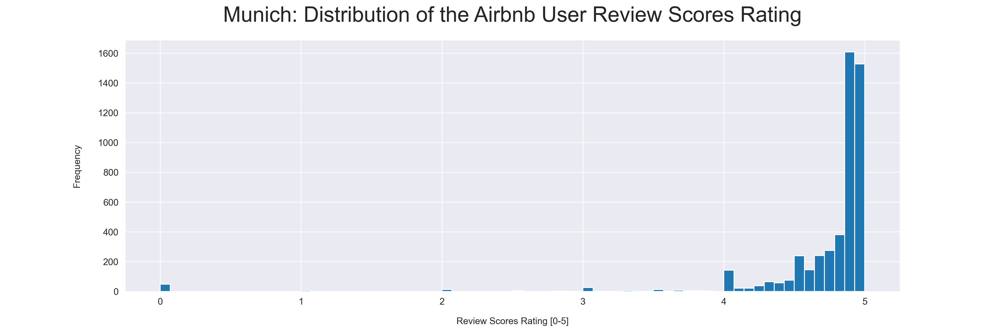

And there they are, the outliers. Naturally existing in every data set, group, flock or swarm.<br>
Considering that user review scores around a value of 3.00 are still a satisfactory evaluation, I decided to filter only the data with user review scores equal to or less than 2.00 scores.

> As a **result** I found **68 apartments** with a **very bad rating**.<br>
> Compared to the overall quantity of apartments in Munich it is an **negligible**  value of **1.4 %**.

Anyway, if you do not like incredible adventures, you should choose your Airbnb apartment wisely.


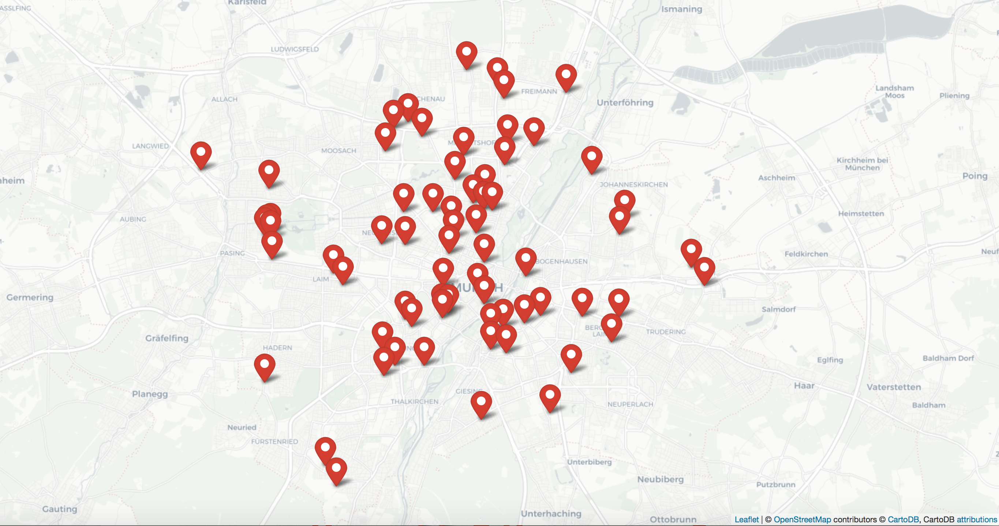

---

<br>

#### Question: 4. What features are contributing to estimate the price of an apartment?

Originally, I wanted to analyze the price across the seasons by using machine learning. But unfortunately the data did not include a price that changed over time. So I decided to look at the features that help estimate the price of an apartment. It is getting a little bit more serious now as you probably noticed.

By counting the number of apartments correlated to the price it becomes clear that there are some apartments with really cheeky high prices. Here they are again, the runaways.

> However, the result shows that **most** of the registered **apartments** are in the **acceptable price range**.

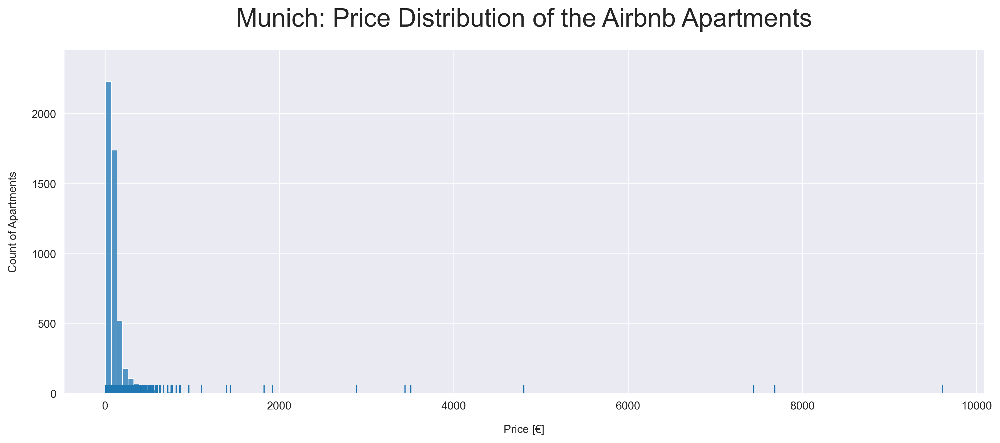

More interesting is the price distribution of the Airbnb apartments by districts.<br>
This results in the following short list:

> **Most expensive districts:**
> 1. Altstadt-Lehel
> 2. Schwanthalerhöhe
> 3. Ludwigvorstadt-Isarvorstadt

> **Least expensive districts:**
> 1. Aubing-Lochhausen-Langwied
> 2. Milbertshofen-Am Hart


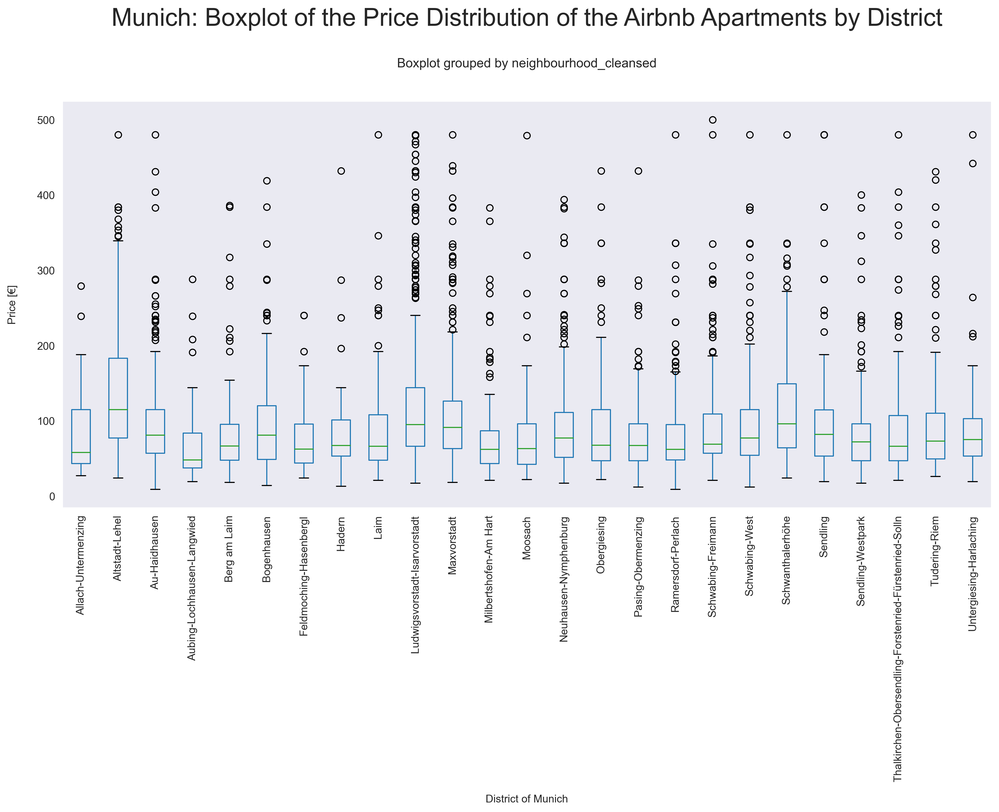

While having a look at the price distribution of the Airbnb apartments by room type it is obviously that the following categories are the one with higher prices per average.

**Higher prices:**
>* **Entire home / Entire apartment**<br>
>* **Hotel room**<br><br>


Whereas the lowest average of prices for renting an Airbnb apartment in Munich include the following categories:

**Lower prices:**
>* **Private room**<br>
>* **Share room**<br><br>



Interestingly there is one conspicuity when it comes to the price diversification. The following categories have the biggest price range up to 500 € per rent:

**Biggest price range:**
>* **Entire home / Entire apartment**<br>
>* **Private room**<br>

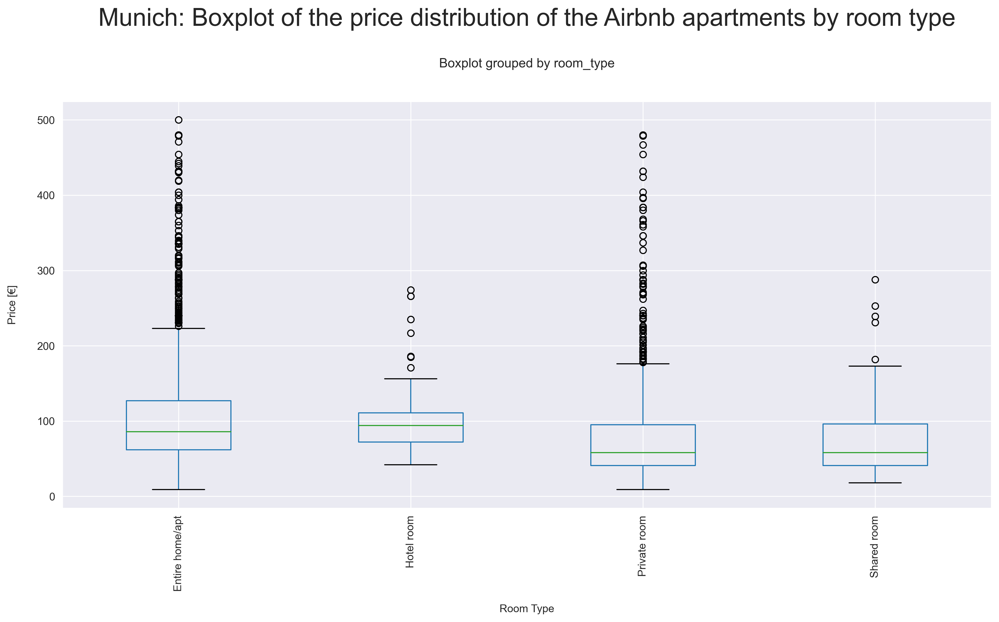

Before I present the results of my machine learning model, I thought about looking again at the distribution of user score ratings correlated with price by using a scatterplot.<br>
The result is similar to the previous histogram with one big difference.

> Here it is definitely an evidence that **it is possible** to find a **good rated Airbnb apartment** for an **appropriate price in Munich**.<br>

Why? Because the biggest amount of these tiny dots is concentrated between a user score rating from 4.00 to 5.00 scores and under a price of 100 € per apartment.<br><br>
We will not talk about the outliers again. They are everywhere.

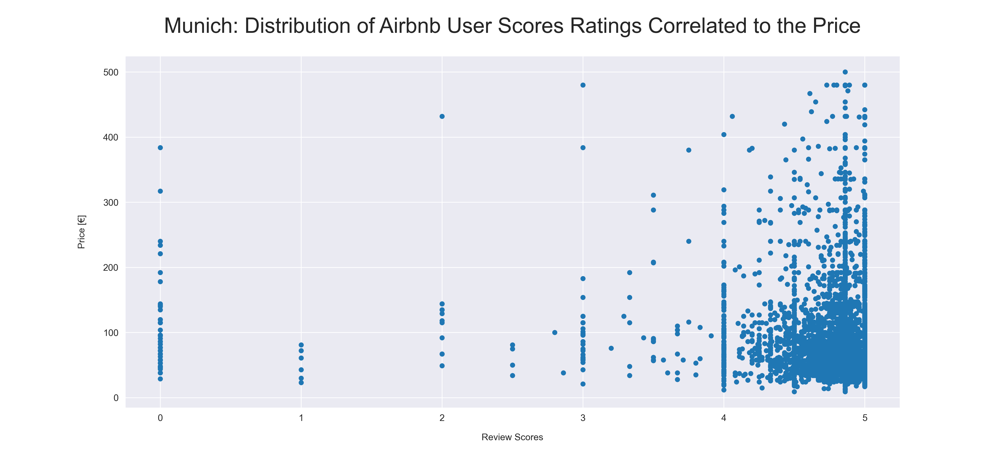

<br><br>
Based on the results of the linear regression machine learning model I used for my analysis, the following features determine how high the price for an Airbnb apartment in Munich will be:
>* **District**
>* **Type and amount of bathrooms**

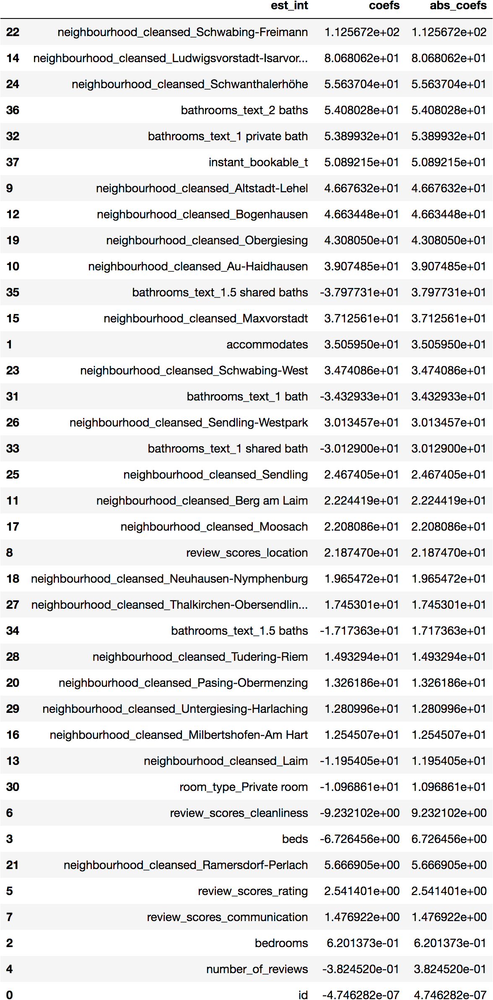

### Conclusion

Based on the analysis, when visiting Munich and renting an apartment on Airbnb you should:

**1. Book your apartment with adequate time upfront.**

**2. Consider the following districts first to find an good quality apartment:**
>* Ludwigsvorstadt-Isarvorstadt<br>
>* Au-Haidhausen<br>
>* Schwabing-West<br>

**3. Design your own preferences: Choose an apartment you feel comfortable with.**<br><br>
> **Most expensive districts:**
>>* Altstadt-Lehel
>>* Schwanthalerhöhe
>>* Ludwigvorstadt-Isarvorstadt

>**Least expensive districts:**
>>* Aubing-Lochhausen-Langwied
>>* Milbertshofen-Am Hart

>**Higher priced room type:**
>>* Entire home / Entire apartment
>>* Hotel room

>**Lower priced room type:**
>>* Private room
>>* Share room

>**Biggest price ranged room type:**
>>* Entire home / Entire apartment
>>* Private room

<br><br>
**This is a basic analysis to show the possibilities of a machine learning model. Further and more in-depth analysis and projects could examine the user rating rating to find out how truthful the ratings are.**
<br><br>

---

<a id='dep'></a>
## 6. Deploy
<div style="text-align: right"><right><a href="#top">Table of Content</a></div>

### <a href="https://github.com/SebastianHess/airbnb_munich">My Github Repository</a>

### <a href="https://medium.com/@sebastian.sh.hess/data-science-airbnb-munich-machine-learning-analysis-755761031699">My Medium Blog</a>
<br><br>

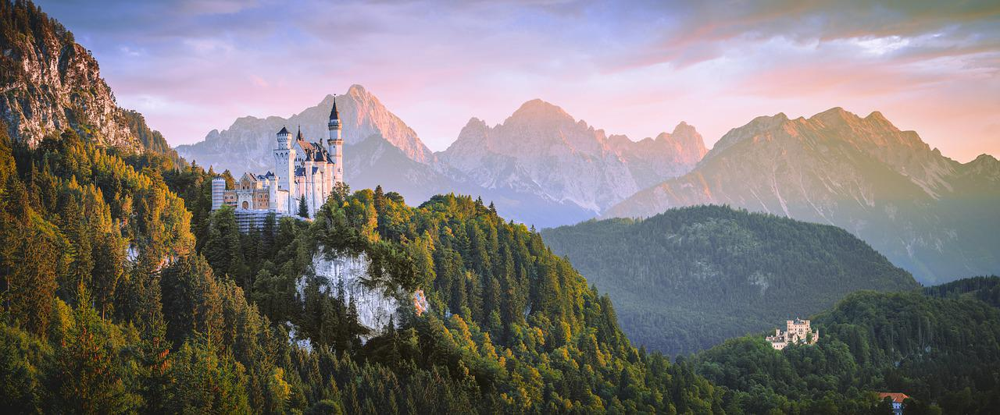